# Practical 1 - Instance Segmentation

In this notebook you will learn how to segment images with a framework and inspect its performance. For this you will calculate the intersection over union. After applying a framework on the task you will take steps towards implementation of a complete image segmentation pipeline. The goal is to implement at least the loss function as all parts may take too much time or compute to finish.

# Exercises
1. Given is a collection of images with various objects, indoor and outdoor. How many of these images show **sheep**? Note: You can code this yourself or use the pycocotools API (strongly recommended).
   
   1.1. Show 10 example images from the dataset containing sheep
3. In a cell further down you see the variable region_rel_coords. This presents a region in the image. How many images have sheeps in them who are within that region? Within here means that their intersection over union is at least 40%. Implement an intersection over union algorithm or use a library that calculates the intersection over union to calculate the overlap.
**Note**: For this exercise you can use the bounding box or the segmentation mask of the sheep which pycocotools can give you. Using the bounding box will be easier because some tools work with run-length encoding (RLE) of segmentation masks and others with polygons.
4. How much pixel area in total do all sheeps cover which are within the region, according to the definition of "within" of exercise 2? You will need to figure out which sheeps are within the region and then add the areas of those sheeps, also outside of the region! No need to calculate the area of the overlap only within the region! (Alternative: If you can not solve 2. then calculate how much area all sheeps cover.
5. Begin writing the code to implement your own segmentation model. Due to time constraints it may be not possible to finish all so start with the loss function.
   
   4.1 Take the given detectron 2 code to perform semantic segmentation on the sheep images. Note that previously everything worked with the ground truth segments saved in local files. Detectron 2 will do a prediction based on a saved checkpoint.
   
   4.2 Code is given to show you how you can get ground truth bounding boxes, predicted bounding boxes and calculate pairwise IoU between them. Use the code to find the prediction to every ground truth and calculate a loss on the segmentation. Note, the loss should be calculated on the segmentation which you can get (code examples are given). Implement the Binary Cross-Entropy Loss to compare the predicted segmentation with the ground truth segmentation to calculate a loss.
6. (Optional if the rest is too easy): You have seen how to access and handle images from the COCO 2017 dataset and prediction and ground truth masks. Implement the rest of the pipeline to train a simple segmentation Unet. The code for the Unet in PyTorch is given but you are free to implement everything in Keras.

# The following cells install a few elementary libraries. 

In [1]:
%%capture 
# to ignore unneeded output. Comment out if you run into errors
!python -m pip install torch torchvision torchaudio
!python -m pip install opencv-python

In [2]:
!python -m pip install fvcore
!python -m pip install cloudpickle
!python -m pip install omegaconf
!python -m pip install pycocotools
!python -m pip install requests

## Very important workaround to get rid of a matplotlib bug

In [8]:
# Workaround to suppress matplotlib outputs that would otherwise fill the screen.
import logging
logging.getLogger('matplotlib').setLevel(logging.ERROR)
import urllib.request
from zipfile import ZipFile
import os
def download(url, filename):
    # download with check if file exists already
    if os.path.isfile(filename):
        return
    urllib.request.urlretrieve(url,filename)
def unzip(filename, dest_path = None):
    # unzips a zip file in the folder of the notebook to the notebook
    with ZipFile(filename, 'r') as zObject: 
        # Extracting all the members of the zip  
        # into a specific location. a
        if dest_path is None:
            zObject.extractall(path=os.getcwd())
        else:
            zObject.extractall(path=dest_path)

In [7]:
# The following lines download the data from Mines Paris but will take longer from Shanghai. If you encounter difficulties with the following cell then uncomment this instead
#download("https://cloud.minesparis.psl.eu/index.php/s/dkMhq4lBeSR5sXR/download", "val2017.zip")
#unzip('val2017.zip',os.path.join('datasets','coco'))
#download("https://cloud.minesparis.psl.eu/index.php/s/mVxRnKz2WpIFB1c/download", "annotations_trainval2017.zip")
#unzip('annotations_trainval2017.zip')
#os.makedirs(os.path.join('datasets','coco'),exist_ok=True)
#unzip('annotations_trainval2017.zip',os.path.join('datasets','coco'))
#download("https://cloud.minesparis.psl.eu/index.php/s/fqYlDI8Ai1H33Mt/download", "model_final_2d9806.pkl")
#download("https://cloud.minesparis.psl.eu/index.php/s/2JKfv4gNV9wgwnR/download", "unet_parts.py")
#download("https://cloud.minesparis.psl.eu/index.php/s/rHSXL02qbw274Bh/download", "unet_model.py")
#download("https://cloud.minesparis.psl.eu/index.php/s/GEHbk5FUzpIkUui/download", "detectron2.zip")
#unzip('detectron2.zip')

In [8]:
download("https://jbox.sjtu.edu.cn:10081/v2%2Fdelivery%2Fdata%2Fd8b44683dda94a73a29c6008d27bc0ec%2F?", "val2017.zip")
unzip('val2017.zip',os.path.join('datasets','coco'))
download("https://jbox.sjtu.edu.cn:10081/v2%2Fdelivery%2Fdata%2F534075e71c1a43199ef90c66c8ae588e%2F?", "annotations_trainval2017.zip")
unzip('annotations_trainval2017.zip')
os.makedirs(os.path.join('datasets','coco'),exist_ok=True)
unzip('annotations_trainval2017.zip',os.path.join('datasets','coco'))
download("https://jbox.sjtu.edu.cn:10081/v2%2Fdelivery%2Fdata%2Fcddfe92c9def49279483578fef9a62f2%2F?", "model_final_2d9806.pkl")
download("https://jbox.sjtu.edu.cn:10081/v2%2Fdelivery%2Fdata%2Fdc395a718bfd4669aceb690e8c495982%2F?", "unet_parts.py")
download("https://jbox.sjtu.edu.cn:10081/v2%2Fdelivery%2Fdata%2F0dec69491a744710a771b0d902ba17b6%2F?", "unet_model.py")
download("https://jbox.sjtu.edu.cn:10081/v2%2Fdelivery%2Fdata%2F570629a77ea342a7bbaf5fa1bd43e2f3%2F?", "detectron2.zip")
unzip('detectron2.zip')

KeyboardInterrupt: 

In [18]:
%%capture
if not os.path.isdir('detectron2'):
    os.rename(os.path.join(os.getcwd(), 'detectron2-main'), os.path.join(os.getcwd(), 'detectron2'))
# Capture supresses outputs which clutter the notebook. Please remove if something goes wrong
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
#!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
import torch, detectron2
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random


# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

from IPython import display
import PIL
from detectron2.evaluation import coco_evaluation

# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# [...]
import os
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image
import requests
from pycocotools.coco import COCO

images_val_folder = "datasets/coco/val2017" #'./val2017'
annotations_val_folder = "datasets/coco/annotations" #'./annotations'
coco_annotation_file_path = os.path.join(annotations_val_folder,'instances_val2017.json')
coco_annotation = COCO(annotation_file=coco_annotation_file_path)

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader, DatasetMapper
from detectron2.structures import pairwise_iou, masks
from detectron2.data import detection_utils as utils


img_id = 197528
img_info = coco_annotation.loadImgs([img_id])[0]
img_file_name = img_info["file_name"]

# Get all the annotations for the specified image.
ann_ids = coco_annotation.getAnnIds(imgIds=[img_id], iscrowd=None)
anns = coco_annotation.loadAnns(ann_ids)

# Re-load the img in case it changed in previous code
from IPython import display
filename = coco_annotation.loadImgs([img_id])[0]['file_name']
im = Image.open(os.path.join(images_val_folder,filename))
cfg = get_cfg()

if not torch.cuda.is_available():
    cfg.MODEL.DEVICE = "cpu"

model_config = 'COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml' # This downloads and loads one of the best segmentation models available in Detectron 2
cfg.merge_from_file(model_zoo.get_config_file(model_config))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2  # set threshold for this model
cfg.MODEL.WEIGHTS = './model_final_2d9806.pkl'#model_zoo.get_checkpoint_url(model_config)
predictor = DefaultPredictor(cfg)
outputs = predictor(np.array(im))

[11/05 23:59:08 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./model_final_2d9806.pkl ...


# Exercise 1

In [ ]:
images_val_folder = "datasets/coco/val2017" #'./val2017'
annotations_val_folder = "datasets/coco/annotations" #'./annotations'

In [ ]:
import os
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image
import requests
from pycocotools.coco import COCO

coco_annotation_file_path = os.path.join(annotations_val_folder,'instances_val2017.json')
coco_annotation = COCO(annotation_file=coco_annotation_file_path)

loading annotations into memory...
Done (t=0.48s)
creating index...
index created!


## Some example code is given but you need information how to select a certain class and load images containing it. See https://github.com/cocodataset/cocoapi/blob/master/PythonAPI/pycocotools/coco.py

Annotations for Image ID 197528:
[{'segmentation': [[128.86, 454.14, 137.45, 379.69, 153.2, 333.87, 193.29, 293.78, 219.06, 270.87, 230.51, 262.28, 224.79, 229.35, 240.54, 180.67, 219.06, 131.99, 226.22, 116.24, 267.74, 140.58, 322.15, 152.04, 353.65, 159.19, 390.87, 280.89, 377.99, 418.34, 360.81, 472.75, 347.92, 601.61, 363.67, 637.4, 327.87, 635.97, 309.26, 624.52, 140.31, 532.89, 130.29, 446.98]], 'area': 89325.15205, 'iscrowd': 0, 'image_id': 197528, 'bbox': [128.86, 116.24, 262.01, 521.16], 'category_id': 17, 'id': 51109}]


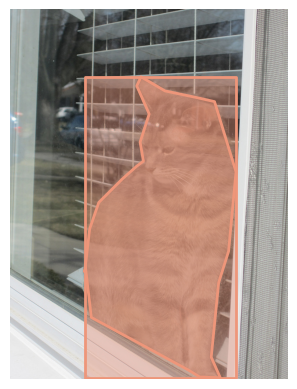

In [ ]:
img_id = 197528
img_info = coco_annotation.loadImgs([img_id])[0]
img_file_name = img_info["file_name"]

# Get all the annotations for the specified image.
ann_ids = coco_annotation.getAnnIds(imgIds=[img_id], iscrowd=None)
anns = coco_annotation.loadAnns(ann_ids)
print(f"Annotations for Image ID {img_id}:")
print(anns)

# Load image from local dataset
im = Image.open(os.path.join(images_val_folder,img_info['file_name']))
# If dataset download failed, get directly from url
#im = Image.open(requests.get(img_url, stream=True).raw)

# Save image and its labeled version.
plt.axis("off")
plt.imshow(np.asarray(im))
coco_annotation.showAnns(anns, draw_bbox=True)
plt.show()

loading annotations into memory...
Done (t=0.26s)
creating index...
index created!
包含绵羊的图像数量: 65


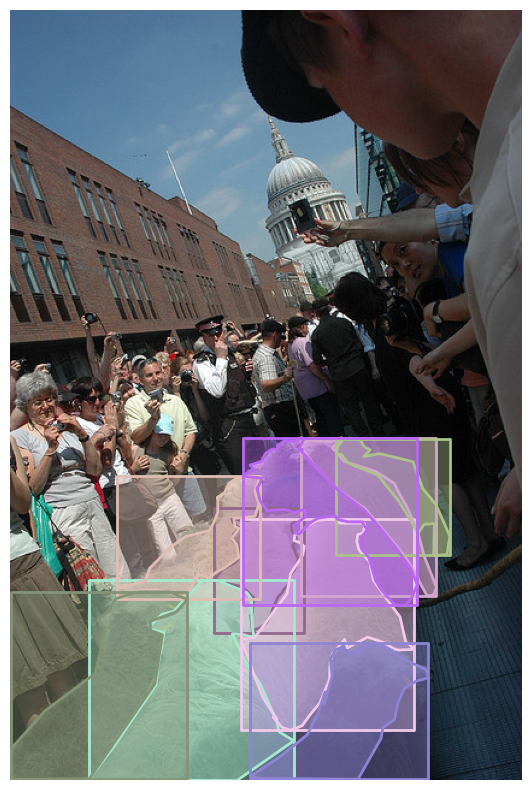

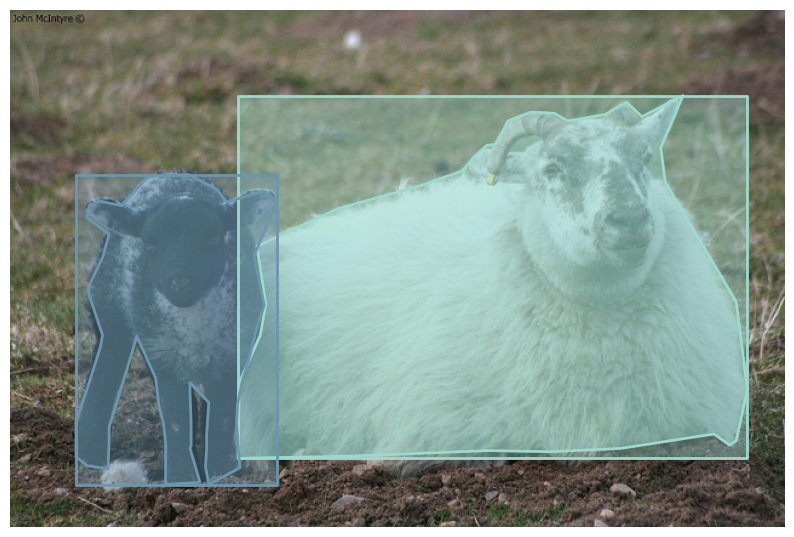

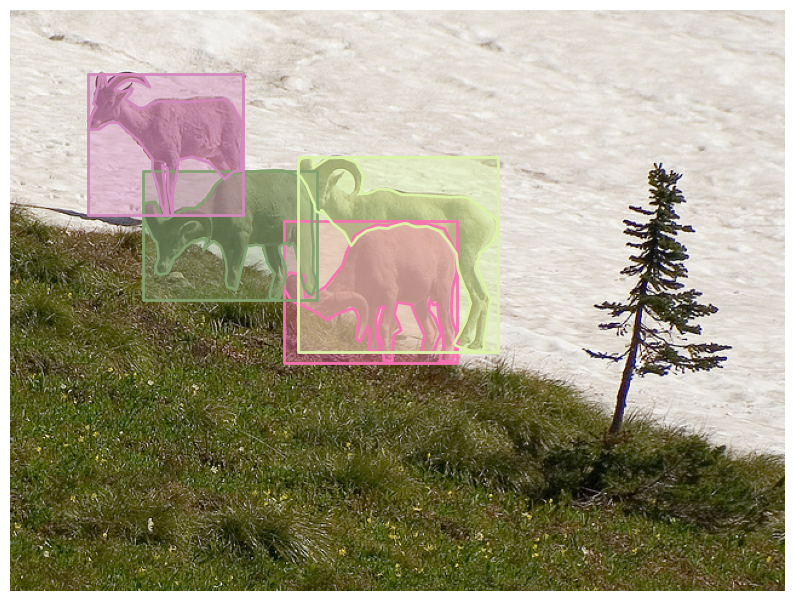

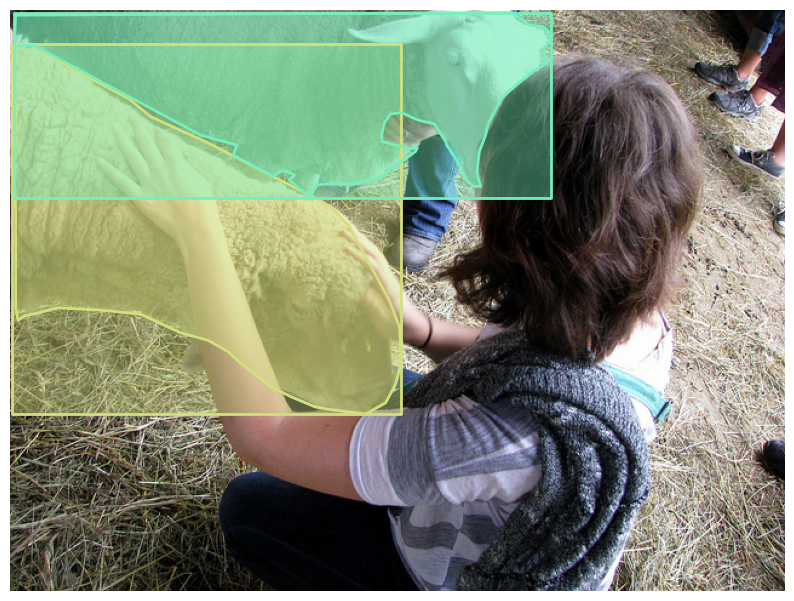

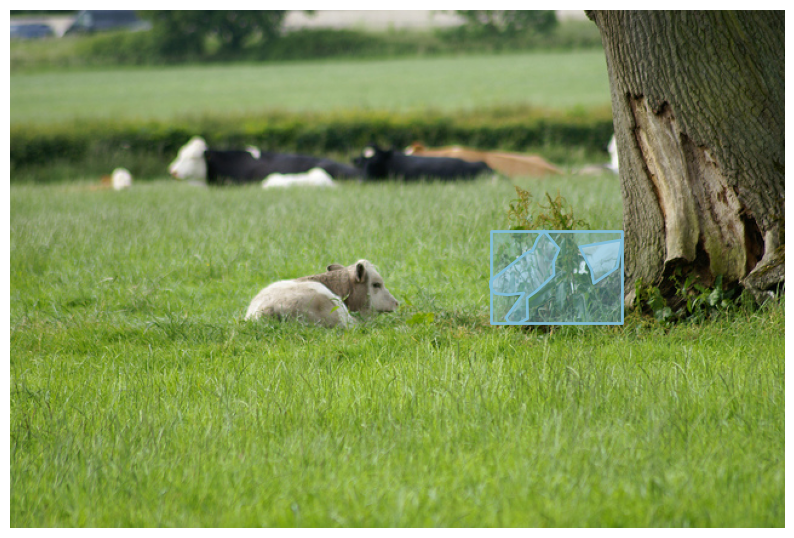

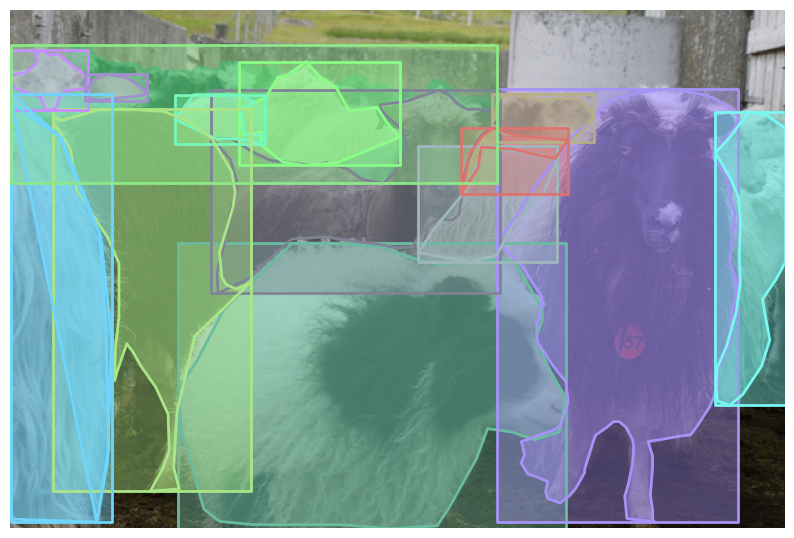

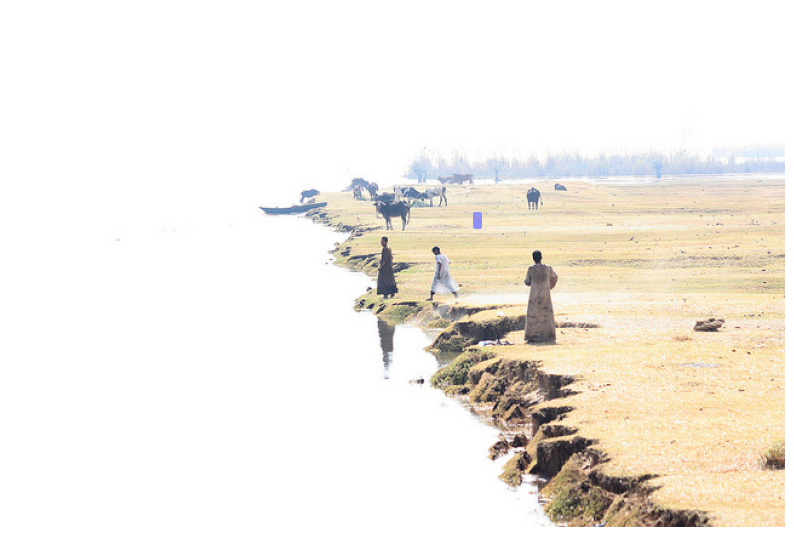

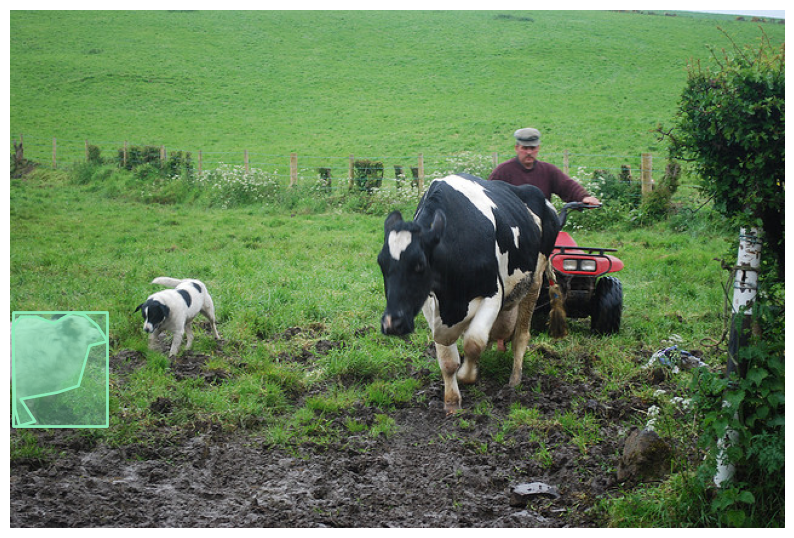

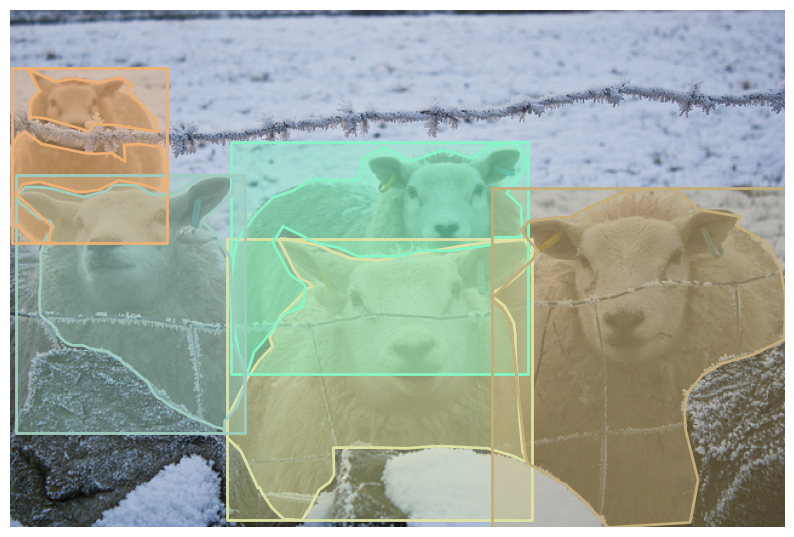

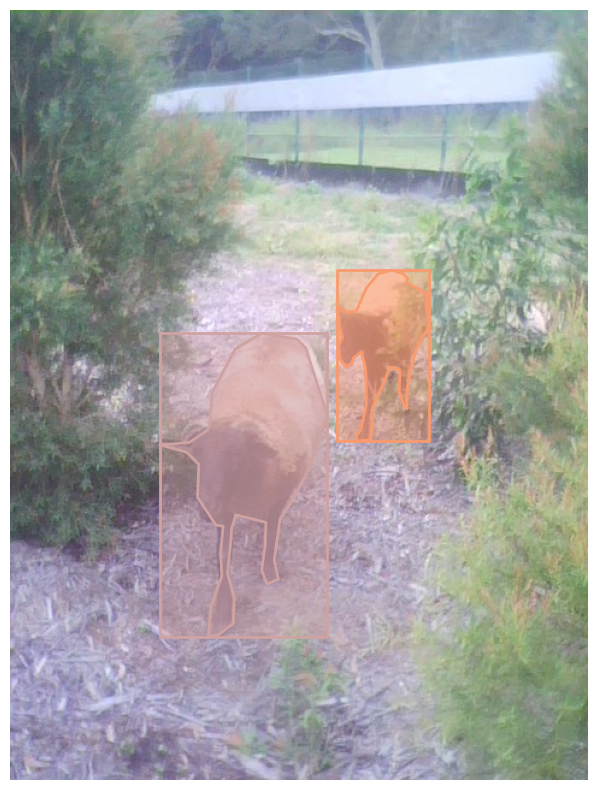

In [ ]:
import os
import matplotlib.pyplot as plt
from pycocotools.coco import COCO

images_val_folder = "datasets/coco/val2017"
annotations_val_folder = "datasets/coco/annotations"
coco_annotation_file_path = os.path.join(annotations_val_folder, 'instances_val2017.json')
coco_annotation = COCO(annotation_file=coco_annotation_file_path)
sheep_category_id = coco_annotation.getCatIds(catNms=['sheep'])[0]
sheep_image_ids = coco_annotation.getImgIds(catIds=[sheep_category_id])

print(f"包含绵羊的图像数量: {len(sheep_image_ids)}")

for img_id in sheep_image_ids[:10]:
    img_info = coco_annotation.loadImgs([img_id])[0]
    img_file_name = img_info["file_name"]
    
    img_path = os.path.join(images_val_folder, img_file_name)
    img = plt.imread(img_path)
    
    ann_ids = coco_annotation.getAnnIds(imgIds=[img_id], catIds=[sheep_category_id], iscrowd=None)
    anns = coco_annotation.loadAnns(ann_ids)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    coco_annotation.showAnns(anns, draw_bbox=True)
    plt.axis('off')
    plt.show()

# Exercise 2

### In this cell the bounding box is given in relative coordinates with a relative position (x,y) at the top left and then relative width and height. 1 is the maximum in the direction up and right and 0 the minimum, reached at the left and down. Images in the dataset have different sizes so you need to calculate the absolute coordinates every time.

In [ ]:
# Format: [x position top left, y position top left, width, height]
region_rel_coords = np.array([0.3, 0.6, 0.3, 0.2])

In [ ]:
from copy import deepcopy
fake_ann = deepcopy(anns[0])

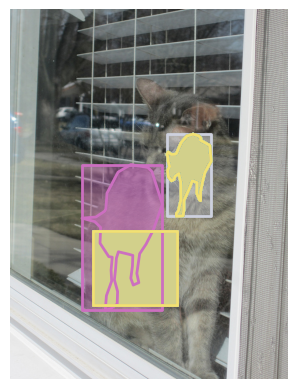

In [ ]:
# The most easy way to quickly draw a bbox into the image to see it is to add a fake annotation for the pycocotools to show
fake_ann['bbox'] = [region_rel_coords[0]*im.width, region_rel_coords[1]*im.height, region_rel_coords[2]*im.width, region_rel_coords[3]*im.height]
# fake_ann['bbox'] = [200,200,100,123] # This is an example box. You need to change it.
anns = anns + [fake_ann]

region = np.array(fake_ann['bbox'])

plt.axis("off")
plt.imshow(np.asarray(im))
coco_annotation.showAnns(anns, draw_bbox=True)
plt.show()

In [ ]:
def calculate_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2
    
    xi1 = max(x1, x2)
    yi1 = max(y1, y2)
    xi2 = min(x1 + w1, x2 + w2)
    yi2 = min(y1 + h1, y2 + h2)
    
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    
    box1_area = w1 * h1
    box2_area = w2 * h2
    union_area = box1_area + box2_area - inter_area
    
    iou = inter_area / union_area
    return iou

def relative_to_absolute(region_rel_coords, img_width, img_height):
    x_rel, y_rel, w_rel, h_rel = region_rel_coords
    x_abs = x_rel * img_width
    y_abs = y_rel * img_height
    w_abs = w_rel * img_width
    h_abs = h_rel * img_height
    return [x_abs, y_abs, w_abs, h_abs]

images_val_folder = "datasets/coco/val2017"
annotations_val_folder = "datasets/coco/annotations"
coco_annotation_file_path = os.path.join(annotations_val_folder, 'instances_val2017.json')
coco_annotation = COCO(annotation_file=coco_annotation_file_path)
sheep_category_id = coco_annotation.getCatIds(catNms=['sheep'])[0]
sheep_image_ids = coco_annotation.getImgIds(catIds=[sheep_category_id])
region_rel_coords = np.array([0.3, 0.6, 0.3, 0.2])

count = 0
for img_id in sheep_image_ids:
    img_info = coco_annotation.loadImgs([img_id])[0]
    img_width = img_info['width']
    img_height = img_info['height']
    
    region_abs_coords = relative_to_absolute(region_rel_coords, img_width, img_height)
    
    ann_ids = coco_annotation.getAnnIds(imgIds=[img_id], catIds=[sheep_category_id], iscrowd=None)
    anns = coco_annotation.loadAnns(ann_ids)
    
    for ann in anns:
        bbox = ann['bbox']
        iou = calculate_iou(bbox, region_abs_coords)
        if iou >= 0.4:
            count += 1
            break

print(f"Sheeps in the region: {count}")

loading annotations into memory...
Done (t=0.52s)
creating index...
index created!
Sheeps in the region: 3


# Exercise 3

In [ ]:
def calculate_iou2(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2
    
    xi1 = max(x1, x2)
    yi1 = max(y1, y2)
    xi2 = min(x1 + w1, x2 + w2)
    yi2 = min(y1 + h1, y2 + h2)
    
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    
    box1_area = w1 * h1
    box2_area = w2 * h2
    union_area = box1_area + box2_area - inter_area
    
    iou = inter_area / union_area
    return iou, inter_area

total_area = 0
for img_id in sheep_image_ids:
    img_info = coco_annotation.loadImgs([img_id])[0]
    img_width = img_info['width']
    img_height = img_info['height']
    
    region_abs_coords = relative_to_absolute(region_rel_coords, img_width, img_height)
    
    ann_ids = coco_annotation.getAnnIds(imgIds=[img_id], catIds=[sheep_category_id], iscrowd=None)
    anns = coco_annotation.loadAnns(ann_ids)
    
    for ann in anns:
        bbox = ann['bbox']
        iou, inter_area = calculate_iou2(bbox, region_abs_coords)
        if iou >= 0.4:
            total_area += bbox[2] * bbox[3]

print(f"area: {total_area} pixels")


area: 50485.906800000004 pixels


标签: sheep
边界框: [168.9, 413.03, 74.55, 104.02]
分割掩码: [[183.81, 422.85, 185.63, 422.85, 189.99, 423.58, 193.99, 423.94, 197.99, 423.58, 201.26, 422.49, 204.17, 421.03, 206.36, 417.03, 209.63, 415.21, 213.63, 413.76, 216.9, 413.03, 222.72, 413.39, 227.09, 414.12, 229.27, 415.21, 230.0, 415.58, 231.09, 416.3, 235.09, 416.3, 238.73, 415.21, 242.0, 414.85, 243.45, 414.85, 243.45, 416.3, 243.45, 420.3, 238.73, 422.85, 237.64, 423.58, 233.63, 426.85, 233.63, 428.31, 233.63, 430.12, 233.63, 432.31, 235.45, 434.85, 237.27, 437.4, 237.64, 438.85, 237.64, 441.04, 235.82, 442.85, 234.36, 444.67, 236.18, 449.04, 236.91, 451.22, 239.09, 455.22, 239.09, 455.95, 238.0, 459.22, 237.27, 461.77, 235.45, 465.4, 233.63, 467.95, 231.45, 471.59, 230.73, 477.04, 228.54, 479.59, 227.09, 481.04, 225.27, 484.32, 222.36, 487.23, 221.27, 489.41, 218.0, 497.05, 216.54, 502.14, 214.72, 505.05, 212.54, 509.05, 207.08, 513.05, 202.72, 514.5, 202.72, 517.05, 201.26, 516.32, 199.45, 502.87, 200.9, 500.68, 201.26, 493.77,

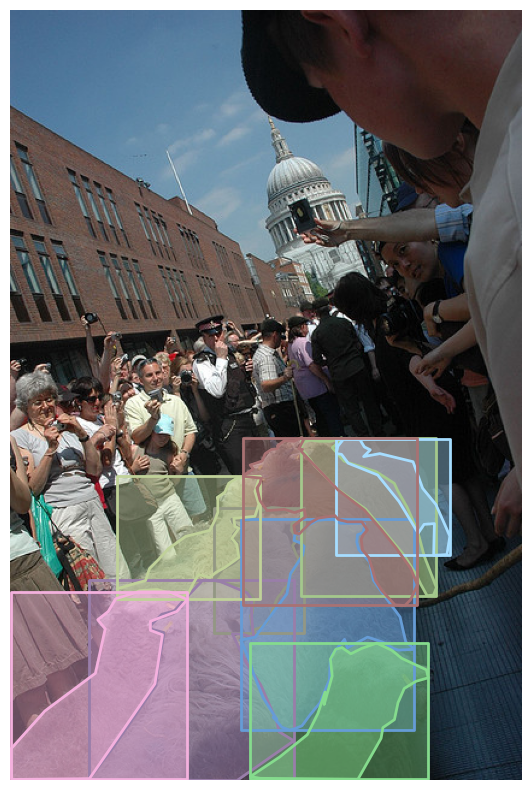

In [ ]:
first_sheep_image_id = sheep_image_ids[0]

img_info = coco_annotation.loadImgs([first_sheep_image_id])[0]
img_file_name = img_info["file_name"]
img_width = img_info['width']
img_height = img_info['height']

img_path = os.path.join(images_val_folder, img_file_name)
img = plt.imread(img_path)

ann_ids = coco_annotation.getAnnIds(imgIds=[first_sheep_image_id], catIds=[sheep_category_id], iscrowd=None)
anns = coco_annotation.loadAnns(ann_ids)

for ann in anns:
    print(f"标签: {coco_annotation.loadCats(ann['category_id'])[0]['name']}")
    print(f"边界框: {ann['bbox']}")
    print(f"分割掩码: {ann['segmentation']}")

plt.figure(figsize=(10, 10))
plt.imshow(img)
coco_annotation.showAnns(anns, draw_bbox=True)
plt.axis('off')
plt.show()

# Exercise 4

## Install detectron2

### Some imports here are copied in case you need to restart the notebook and don't want to execute the head again

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader, DatasetMapper
from detectron2.structures import pairwise_iou, masks
from detectron2.data import detection_utils as utils

In [ ]:
# Re-load the img in case it changed in previous code
from IPython import display
filename = coco_annotation.loadImgs([img_id])[0]['file_name']
im = Image.open(os.path.join(images_val_folder,filename))
cfg = get_cfg()

if not torch.cuda.is_available():
    cfg.MODEL.DEVICE = "cpu"

model_config = 'COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml' # This downloads and loads one of the best segmentation models available in Detectron 2
cfg.merge_from_file(model_zoo.get_config_file(model_config))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2  # set threshold for this model
cfg.MODEL.WEIGHTS = './model_final_2d9806.pkl'#model_zoo.get_checkpoint_url(model_config)
predictor = DefaultPredictor(cfg)
outputs = predictor(np.array(im))

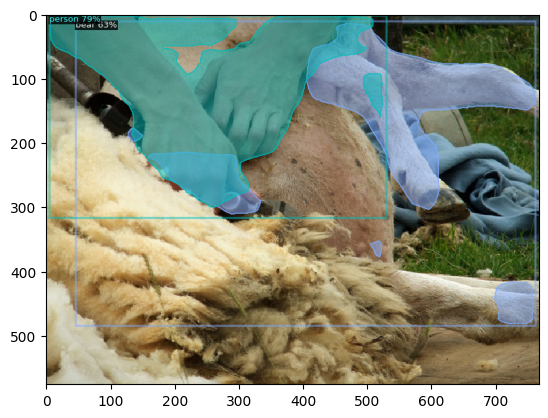

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(np.array(im)[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.imshow(out.get_image()[:, :, ::-1])

In [ ]:
val_data_loader = build_detection_test_loader(cfg,cfg.DATASETS.TEST[0], DatasetMapper(cfg,True))

[11/05 17:53:51 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[11/05 17:53:53 d2.data.datasets.coco]: Loading datasets/coco/annotations/instances_val2017.json takes 2.16 seconds.
[11/05 17:53:53 d2.data.datasets.coco]: Loaded 5000 images in COCO format from datasets/coco/annotations/instances_val2017.json
[11/05 17:53:53 d2.data.build]: Distribution of instances among all 80 categories:
|   category    | #instances   |   category   | #instances   |   category    | #instances   |
|:-------------:|:-------------|:------------:|:-------------|:-------------:|:-------------|
|    person     | 10777        |   bicycle    | 314          |      car      | 1918         |
|  motorcycle   | 367          |   airplane   | 143          |      bus      | 283          |
|     train     | 190          |    truck     | 414          |     boat      | 424  

## In the following some code is given to show you how to get ground truth and prediction segmentation masks. You will need to add some code to make sure: 
1. Only sheep classes are used for the loss prediction.
2. Implement the loss on the polygons
3. Maybe decide which prediction you want to use if several overlap the ground truth well

In [ ]:
import torch
import torch.nn.functional as F
from detectron2.structures import PolygonMasks, BitMasks, Boxes
from detectron2.utils.visualizer import Visualizer
import numpy as np

metadata = MetadataCatalog.get(cfg.DATASETS.TEST[0])
scale = 1.0

def calculate_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2
    
    xi1 = max(x1, x2)
    yi1 = max(y1, y2)
    xi2 = min(x1 + w1, x2 + w2)
    yi2 = min(x1 + h1, y2 + h2)
    
    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    
    box1_area = w1 * h1
    box2_area = w2 * h2
    union_area = box1_area + box2_area - inter_area
    
    iou = inter_area / union_area
    return iou

total_loss = 0

for batch in val_data_loader:
    for per_image in batch:

        img = per_image["image"].permute(1, 2, 0).cpu().detach().numpy()
        img = utils.convert_image_to_rgb(img, cfg.INPUT.FORMAT)

        visualizer = Visualizer(img, metadata=metadata, scale=scale)
        target_fields = per_image["instances"].get_fields()
        labels = [metadata.thing_classes[i] for i in target_fields["gt_classes"]]
        
        if not 'sheep' in labels:
            continue

        outputs = predictor(np.array(img))
        
        vis = visualizer.overlay_instances(
            labels=labels,
            boxes=target_fields.get("gt_boxes", None),
            masks=target_fields.get("gt_masks", None),
            keypoints=target_fields.get("gt_keypoints", None),
        )

        gt_masks = target_fields["gt_masks"].to("cpu")
        gt_classes = target_fields["gt_classes"].to("cpu")
        sheep_indices = [i for i, label in enumerate(labels) if label == 'sheep']
        gt_sheep_masks = gt_masks[sheep_indices]

        pred_instances = outputs["instances"].to("cpu")
        pred_masks = pred_instances.pred_masks
        pred_classes = pred_instances.pred_classes
        pred_sheep_indices = [i for i, label in enumerate(pred_classes) if metadata.thing_classes[label] == 'sheep']
        pred_sheep_masks = pred_masks[pred_sheep_indices]

        for gt_mask in gt_sheep_masks:
            gt_bitmask = masks.polygons_to_bitmask(gt_mask, height=img.shape[0], width=img.shape[1])
            best_iou = 0
            best_pred_mask = None
            for pred_bitmask in pred_sheep_masks:
                # calculate iou:
                iou = (gt_bitmask & pred_bitmask.numpy()).sum() / (gt_bitmask | pred_bitmask.numpy()).sum()
                if iou > best_iou:
                    best_iou = iou
                    best_pred_mask = pred_bitmask
            if best_pred_mask is not None:
                # turn into float tensor
                gt_mask_tensor = torch.tensor(gt_bitmask).float()
                pred_mask_tensor = best_pred_mask.float() 
                loss = F.binary_cross_entropy(pred_mask_tensor, gt_mask_tensor)
                total_loss += loss.item()

print(f"Total loss: {total_loss}")

Total loss: 447.6550937425345


In [ ]:
pred_boxes = []
pred_classes = []

In [ ]:
# Get the bounding boxes of all predictions into a list
pred_boxes.extend([outputs['instances'].to("cpu")[prediction_id].get_fields()['pred_boxes'] for prediction_id in range(len(outputs['instances']))])

In [ ]:
pred_boxes

[Boxes(tensor([[ 691.5325,  218.0023, 1065.7010,  625.4694]])),
 Boxes(tensor([[213.4384, 253.3507, 754.4952, 720.7828]])),
 Boxes(tensor([[  1.1118, 276.9831, 147.0776, 504.1763]])),
 Boxes(tensor([[107.6583, 209.4979, 385.2127, 714.2524]])),
 Boxes(tensor([[  0.0000, 374.8363, 140.0925, 733.0771]]))]

In [ ]:
pred_classes.extend([outputs['instances'].to("cpu")[prediction_id].get_fields()['pred_classes'] for prediction_id in range(len(outputs['instances']))])

In [ ]:
pred_classes

[tensor([18]), tensor([18]), tensor([18]), tensor([18]), tensor([18])]

In [ ]:
# Get all ground truth bounding boxes
gt_boxes = target_fields.get("gt_boxes", None)

In [ ]:
# These are the pairwise intersection over unions showing how well predictions and ground truth bounding boxes fit
# Note!!!! This will only give you the pairwise iou of the one box you give as prediction_id
prediction_id = 0
pairwise_iou(pred_boxes[prediction_id], gt_boxes) 

tensor([[0.0547, 0.0000, 0.0000, 0.9417, 0.0000]])

In [ ]:
# Sidenote: This could be implemented in a different way using the methods from Boxes but in this way it is a bit clearer what happens. https://detectron2.readthedocs.io/en/latest/_modules/detectron2/structures/boxes.html

In [ ]:
# Get the best fit into an id. Note! This may not be the only good fit. You may need to make a choice
best_fit_id = pairwise_iou(pred_boxes[prediction_id], gt_boxes).argmax()

In [ ]:
# Get the ground truth classes. Note that not all predictions may have the right label and you need to compare
gt_classes = target_fields.get("gt_classes", None)

In [ ]:
# Get ground truth segmentation masjs
gt_masks = target_fields.get("gt_masks", None)

In [ ]:
# Let's take a look at a typical polygon
for mask in gt_masks:
    print(mask)
    break

[array([659.22375   , 625.6       , 649.15992188, 658.68560748,
       640.50675   , 678.82242991, 637.63382813, 727.74579439,
       572.84685938, 726.31850467, 562.78303125, 673.0788785 ,
       558.44784375, 629.89906542, 541.17590625, 631.3435514 ,
       542.62096875, 673.0788785 , 542.62096875, 724.87401869,
       489.37729688, 724.87401869, 485.04210937, 667.31813084,
       469.21523438, 637.10429907, 433.22629688, 570.91588785,
       413.0814375 , 563.71065421, 351.16739063, 562.28336449,
       332.46759375, 543.57383178, 318.06857813, 523.43700935,
       296.47865625, 526.30878505, 292.16067188, 516.2317757 ,
       254.743875  , 519.1035514 , 260.48971875, 503.28299065,
       254.743875  , 496.09495327, 234.5818125 , 493.22317757,
       240.32765625, 464.43663551, 246.09070313, 416.95775701,
       233.13675   , 391.04299065, 240.32765625, 380.98317757,
       253.2988125 , 356.53009346, 290.71560938, 333.4871028 ,
       320.9415    , 317.66654206, 382.83834375, 320.5

In [ ]:
# This method can be used to convert the polygon to a bitmask if you need that
masks.polygons_to_bitmask(mask, height=vis.get_image().shape[0], width= vis.get_image().shape[1])

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

# Exercise 4.2

### Now you have the prediction mask. You can use the coco annotation tools to convert annotations (segmentation polygons) to segmentation masks and then pytorch or another tool to calculate the BCE loss on those masks.

Implemented above. Total loss is 447.6550937425345

# Exercise 5

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms

# Define a simplified UNet
class UNet(nn.Module):
    def __init__(self, num_classes=21):
        super(UNet, self).__init__()
        self.enc1 = self.conv_block(3, 32)
        self.pool = nn.MaxPool2d(2)
        self.enc2 = self.conv_block(32, 64)
        self.enc3 = self.conv_block(64, 128)
        
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = self.conv_block(128, 64)
        self.up2 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.dec2 = self.conv_block(64, 32)
        self.final = nn.Conv2d(32, num_classes, 1)
        
    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True)
        )
        
    def forward(self, x):
        e1 = self.enc1(x)
        p1 = self.pool(e1)
        e2 = self.enc2(p1)
        p2 = self.pool(e2)
        e3 = self.enc3(p2)
        
        up1 = self.up1(e3)
        d1 = self.dec1(torch.cat([up1, e2], dim=1))
        up2 = self.up2(d1)
        d2 = self.dec2(torch.cat([up2, e1], dim=1))
        out = self.final(d2)
        return out
    
val_data_loader = build_detection_test_loader(cfg,cfg.DATASETS.TEST[0], DatasetMapper(cfg,True))

num_epochs = 10
for epoch in range(num_epochs):
    for batch in val_data_loader:
        batch_size = len(batch)
        num_classes = len(metadata.thing_classes)
        height, width = batch[0]["image"].shape[1], batch[0]["image"].shape[2]
        
        one_hot_masks = torch.zeros(batch_size, num_classes, height, width)
        
        for idx, per_image in enumerate(batch):
            img = per_image["image"].permute(1, 2, 0).cpu().detach().numpy()
            img = utils.convert_image_to_rgb(img, cfg.INPUT.FORMAT)

            target_fields = per_image["instances"].get_fields()
            labels = [metadata.thing_classes[i] for i in target_fields["gt_classes"]]

            gt_masks = target_fields["gt_masks"].to("cpu")
            gt_classes = target_fields["gt_classes"].to("cpu")

            for gt_mask, gt_class in zip(gt_masks, gt_classes):
                gt_bitmask = masks.polygons_to_bitmask(gt_mask, height=height, width=width)
                one_hot_masks[idx, gt_class, :, :] = torch.tensor(gt_bitmask)
        
        # Continue with the rest of the training/validation loop

[11/05 23:59:23 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[11/05 23:59:23 d2.data.datasets.coco]: Loaded 5000 images in COCO format from datasets/coco/annotations/instances_val2017.json
[11/05 23:59:23 d2.data.build]: Distribution of instances among all 80 categories:
|   category    | #instances   |   category   | #instances   |   category    | #instances   |
|:-------------:|:-------------|:------------:|:-------------|:-------------:|:-------------|
|    person     | 10777        |   bicycle    | 314          |      car      | 1918         |
|  motorcycle   | 367          |   airplane   | 143          |      bus      | 283          |
|     train     | 190          |    truck     | 414          |     boat      | 424          |
| traffic light | 634          | fire hydrant | 101          |   stop sign   | 75           |
| parking met

NameError: name 'metadata' is not defined